In [2]:
!pip install -U scikit-learn sklearn-compat streamlit packaging



   ---------------------------------------- 0.0/8.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.7 MB ? eta -:--:--
   - -------------------------------------- 0.3/8.7 MB ? eta -:--:--
   - -------------------------------------- 0.3/8.7 MB ? eta -:--:--
   ---- ----------------------------------- 1.0/8.7 MB 1.3 MB/s eta 0:00:06
   ------ --------------------------------- 1.3/8.7 MB 1.5 MB/s eta 0:00:06
   -------- ------------------------------- 1.8/8.7 MB 1.7 MB/s eta 0:00:05
   --------- ------------------------------ 2.1/8.7 MB 1.8 MB/s eta 0:00:04
   -------------- ------------------------- 3.1/8.7 MB 2.0 MB/s eta 0:00:03
   ---------------- ----------------------- 3.7/8.7 MB 2.2 MB/s eta 0:00:03
   ------------------ --------------------- 3.9/8.7 MB 2.2 MB/s eta 0:00:03
   -------------------- ------------------- 4.5/8.7 MB 2.3 MB/s eta 0:00:02
   -------------------- ------------------- 4.5

In [4]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [5]:
!pip install -r ./requirements.txt -qq --user

In [6]:
data = pd.read_csv("data.csv")
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

In [7]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [8]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [6]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [9]:
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming genre_data is a DataFrame and np has been imported as numpy

# Create a pipeline and fit it in one go
cluster_pipeline = make_pipeline(StandardScaler(), KMeans(n_clusters=10))
genre_data['cluster'] = cluster_pipeline.fit_predict(genre_data.select_dtypes(include=[np.number]))


In [8]:
from sklearn.manifold import TSNE
import pandas as pd
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"



# Create a pipeline and apply t-SNE transformation in one step
tsne_pipeline = make_pipeline(StandardScaler(), TSNE(n_components=2, verbose=1, random_state=42))
projection = pd.DataFrame(tsne_pipeline.fit_transform(genre_data.select_dtypes(include=[np.number])),
                          columns=['x', 'y'])
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

# Create the scatter plot
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['genres'])
fig.show()


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.218s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.816694
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.911201
[t-SNE] KL divergence after 1000 iterations: 1.144490


In [10]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

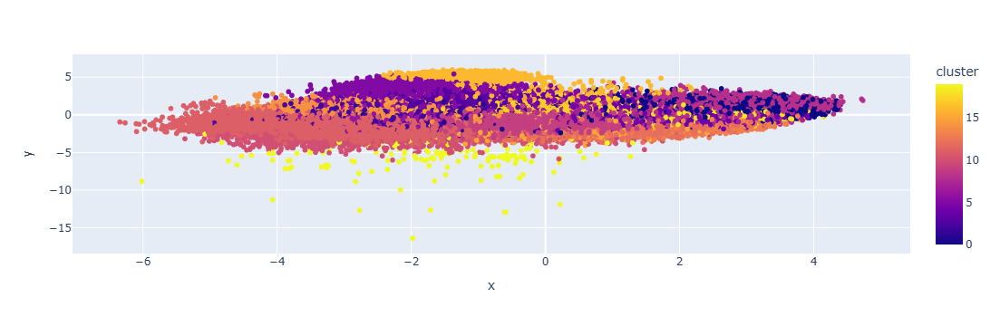

In [11]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()


In [12]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id='0d36ed726736487eb377b8aaae5128a0',
                                                           client_secret='98f4510779b54fccb4fdd6902200fd48'))



def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [13]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [14]:
recommend_songs([{'name': 'Danny Boy', 'year':1921}],  data)

[{'name': 'Giola Giola', 'year': 1930, 'artists': "['Mixalis Thomakos']"},
 {'name': 'Diati Ah Diati',
  'year': 1930,
  'artists': "['Dimitris Filipopoulos']"},
 {'name': 'After the Ball',
  'year': 1928,
  'artists': "['Barbara Cook', 'The Merrill Staton Choir']"},
 {'name': 'Plakiotiki Kithara',
  'year': 1930,
  'artists': "['Panos Visvardis']"},
 {'name': 'Ti Voglio Tanto Bene',
  'year': 1926,
  'artists': "['Beniamino Gigli']"},
 {'name': 'Adieu', 'year': 1936, 'artists': "['Dick Haymes']"},
 {'name': 'Qoly Letafak Yentehe', 'year': 1939, 'artists': "['Umm Kulthum']"},
 {'name': "L'Ultima Canzone", 'year': 1926, 'artists': "['Beniamino Gigli']"},
 {'name': 'Pia Dolia Mana To Lege',
  'year': 1930,
  'artists': "['E. Moraiti', 'Georgia Mittaki', 'Klarino G. Anestopoulos', 'Klarino KOstas Giaouzos', 'Klarinos Nikos Karakostas']"}]

In [15]:
recommend_songs([{'name': 'When Irish Eyes Are Smiling', 'year':1921}],  data)

[{'name': 'Ti Voglio Tanto Bene',
  'year': 1926,
  'artists': "['Beniamino Gigli']"},
 {'name': 'Viens, je sais un pays',
  'year': 1927,
  'artists': "['Edouard Bervily', 'Lucy Perelli', 'Orchestre Edouard Bervily']"},
 {'name': 'Luna rossa', 'year': 1932, 'artists': "['Claudio Villa']"},
 {'name': "Werther, Acte II: Lorsque l'enfant revient d'un voyage",
  'year': 1931,
  'artists': '[\'Ninon Vallin\', \'Georges Thill\', \'Germaine Féraldy\', "Chœur et Orchestre de l\'Opéra de Paris", \'Elie Cohen\']'},
 {'name': 'My Wild Irish Rose', 'year': 1921, 'artists': "['Morton Downey']"},
 {'name': 'A Sweet Irish Sweetheart Of Mine',
  'year': 1921,
  'artists': "['Phil Regan']"},
 {'name': 'Avalon',
  'year': 1934,
  'artists': "['Richard Himber and his Orchestra', 'Joey Nash']"},
 {'name': 'Soltanto Tu, Maria',
  'year': 1926,
  'artists': "['Beniamino Gigli']"},
 {'name': 'Și pe tine or să te doară',
  'year': 1935,
  'artists': "['Manole Stroici']"}]

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score

# Binary target: popular or not
data['is_popular'] = (data['popularity'] > 50).astype(int)

X = data[number_cols]   # your audio features
y = data['is_popular']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(f"F1 Score {f1_score(y_test, y_pred, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_pred)}")


F1 Score 1.0
Accuracy 1.0


In [17]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 136522 entries, 112871 to 121958
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           136522 non-null  float64
 1   year              136522 non-null  int64  
 2   acousticness      136522 non-null  float64
 3   danceability      136522 non-null  float64
 4   duration_ms       136522 non-null  int64  
 5   energy            136522 non-null  float64
 6   explicit          136522 non-null  int64  
 7   instrumentalness  136522 non-null  float64
 8   key               136522 non-null  int64  
 9   liveness          136522 non-null  float64
 10  loudness          136522 non-null  float64
 11  mode              136522 non-null  int64  
 12  popularity        136522 non-null  int64  
 13  speechiness       136522 non-null  float64
 14  tempo             136522 non-null  float64
dtypes: float64(9), int64(6)
memory usage: 16.7 MB


In [18]:
#Implement LIME
from interpret.blackbox import LimeTabular
from interpret import show


lime = LimeTabular(model=clf, data=X_train.values, random_state=1,
                   feature_names=list(X_train.columns), class_names=["Not Popular", "Popular"])

lime_local = lime.explain_local(X_test[:100], y_test[:100], name="LIME")
show(lime_local)

<!-- http://127.0.0.1:7001/1778188580048/ -->

In [19]:
# Create SHAP explainer
import shap 

explainer = shap.TreeExplainer(clf)
# Calculate shapley values for test data
start_index = 1
end_index = 2
shap_values = explainer.shap_values(X_test[start_index:end_index])
X_test[start_index:end_index]


,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
161935,0.583,1976,0.93,0.585,182200,0.272,0,0.115,11,0.128,-16.693,0,26,0.0802,90.104


In [20]:
# Investigating the values (classification problem)
# class 0 = contribution to class 1
# class 1 = contribution to class 2
print(shap_values[0].shape)
shap_values

(15, 2)


array([[[ 9.95837772e-04, -9.95837772e-04],
        [ 2.28235454e-02, -2.28235454e-02],
        [ 1.66290631e-02, -1.66290631e-02],
        [-5.99693954e-04,  5.99693954e-04],
        [ 1.38526771e-03, -1.38526771e-03],
        [ 6.23140124e-03, -6.23140124e-03],
        [ 1.76508426e-03, -1.76508426e-03],
        [ 5.86762519e-03, -5.86762519e-03],
        [-1.84967568e-04,  1.84967568e-04],
        [ 3.15959304e-04, -3.15959304e-04],
        [ 1.22436791e-02, -1.22436791e-02],
        [-1.07415173e-04,  1.07415173e-04],
        [ 1.43686818e-01, -1.43686818e-01],
        [ 6.37553638e-04, -6.37553638e-04],
        [ 3.87489194e-04, -3.87489194e-04]]])

In [21]:
print(shap_values[0])  # class 0
print(shap_values[1])  # class 1

[[ 9.95837772e-04 -9.95837772e-04]
 [ 2.28235454e-02 -2.28235454e-02]
 [ 1.66290631e-02 -1.66290631e-02]
 [-5.99693954e-04  5.99693954e-04]
 [ 1.38526771e-03 -1.38526771e-03]
 [ 6.23140124e-03 -6.23140124e-03]
 [ 1.76508426e-03 -1.76508426e-03]
 [ 5.86762519e-03 -5.86762519e-03]
 [-1.84967568e-04  1.84967568e-04]
 [ 3.15959304e-04 -3.15959304e-04]
 [ 1.22436791e-02 -1.22436791e-02]
 [-1.07415173e-04  1.07415173e-04]
 [ 1.43686818e-01 -1.43686818e-01]
 [ 6.37553638e-04 -6.37553638e-04]
 [ 3.87489194e-04 -3.87489194e-04]]


IndexError: index 1 is out of bounds for axis 0 with size 1

In [22]:
# Visualize local predictions
shap.initjs()
# Force plot
prediction = clf.predict(X_test[start_index:end_index])[0]
print(f"The RF predicted: {prediction}")
shap.force_plot(explainer.expected_value[1],
                shap_values[1],
                X_test[start_index:end_index]) # for values

The RF predicted: 0


IndexError: index 1 is out of bounds for axis 0 with size 1

In [ ]:
# Feature summary
shap.summary_plot(shap_values, X_test)